# Data Preparation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# library

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
!unzip '/content/drive/MyDrive/Healthkathon/Tahap1/Dataset-Healthkathon.zip'

Archive:  /content/drive/MyDrive/Healthkathon/Tahap1/Dataset-Healthkathon.zip
replace sampling_healthkathon2022_diagnosa.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
bpjs_ori = pd.read_csv("/content/sampling_healtkathon2022.csv", dtype={'dati2':'int16','typefaskes':'category','jenkel':'category',
                                'politujuan':'category','jenispel':'int8',
                               'kelasrawat':'int8', 'label':'int64', 'usia':'int8', 'kelasrawat':'int8',
                                'kdsa':'category', 'kdsp':'category', 'kdsr':'category', 'kdsi':'category', 'kdsd':'category', 'cbg':'category'})
bpjs = bpjs_ori.copy()

In [ ]:
bpjs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11401882 entries, 0 to 11401881
Data columns (total 22 columns):
 #   Column       Dtype   
---  ------       -----   
 0   id           int64   
 1   id_peserta   int64   
 2   dati2        int16   
 3   typefaskes   category
 4   usia         int8    
 5   jenkel       category
 6   pisat        float64 
 7   tgldatang    object  
 8   tglpulang    object  
 9   jenispel     int8    
 10  politujuan   category
 11  diagfktp     object  
 12  biaya        float64 
 13  jenispulang  float64 
 14  cbg          category
 15  kelasrawat   int8    
 16  kdsa         category
 17  kdsp         category
 18  kdsr         category
 19  kdsi         category
 20  kdsd         category
 21  label        int64   
dtypes: category(9), float64(3), int16(1), int64(3), int8(3), object(3)
memory usage: 956.9+ MB


In [ ]:
pd.set_option('display.max_columns', None)
bpjs.describe().apply(lambda s: s.apply('{0:.2f}'.format))

,id,id_peserta,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,label
count,11401882.00,11401882.00,11401882.00,11401882.00,11401692.00,11401882.00,11344067.00,11401843.00,11401882.00,11401882.00
mean,5712719.90,4199294.39,182.53,37.06,2.50,1.65,2146848.77,1.09,2.78,0.01
std,3298534.86,2436248.95,106.14,22.92,1.39,0.48,5207576.96,0.51,0.55,0.12
min,1.00,1.00,1.00,0.00,1.00,1.00,0.00,1.00,1.00,0.00
25%,2855432.25,2119461.25,114.00,18.00,1.00,1.00,190400.00,1.00,3.00,0.00
50%,5712226.50,4161531.50,159.00,39.00,3.00,2.00,287200.00,1.00,3.00,0.00
75%,8568901.75,6292148.75,228.00,56.00,4.00,2.00,2996000.00,1.00,3.00,0.00
max,11426957.00,8527919.00,528.00,110.00,5.00,2.00,401696600.00,5.00,3.00,1.00


Berdasarkan penjelasan data *numerical* diatas, terdapat beberapa hal yang perlu diperhatikan:  
1. Pada tabel column usia, terdapat usia 0 tahun dan 110 tahun.
2. Kemudian pada column biaya, terdapat biaya paling tinggi yaitu Rp. 401.696.600. Ini merupakan sebuah outlier yang dapat merusak model.

In [ ]:
bpjs.describe(include = ['object', 'category'])

,typefaskes,jenkel,tgldatang,tglpulang,politujuan,diagfktp,cbg,kdsa,kdsp,kdsr,kdsi,kdsd
count,11401882,11401833,11401882,11401882,7360427,11399352,11401882,11203212,11204875,11203423,11203419,11206701
unique,26,2,1096,1247,261,17012,1034,36,13,6,4,12
top,SC,P,2019-04-21T17:00:00.000Z,2019-02-17T17:00:00.000Z,IGD,Z09.8,Q-5-44-0,None,None,None,None,None
freq,3165558,6161677,17765,16750,1569251,407556,2678848,11190211,11132240,11196767,11193942,11054493


Berdasarkan data *category* diatas perlu diperhatikan beberapa hal seperti:  
1. Pada column kdsa, kdsp, kdsr, kdsi, kdsd. Terdapat tipe yang sering muncul yaitu None, dimana jumlah frequency nya adalah 11 juta lebih dan hampir menyamain keseluruhan jumlah data. Ini adalah hal yang tidak wajar, karena "None" biasanya merupakan sebuah missing values.
2. Kemudian untuk column diagfktp dan cbg memiliki jumlah uniq values yang tergolong cukup banyak dan harus diperhatikan untuk bentuk dari uniq tersebut

In [ ]:
bpjs.isna().sum()

id                   0
id_peserta           0
dati2                0
typefaskes           0
usia                 0
jenkel              49
pisat              190
tgldatang            0
tglpulang            0
jenispel             0
politujuan     4041455
diagfktp          2530
biaya            57815
jenispulang         39
cbg                  0
kelasrawat           0
kdsa            198670
kdsp            197007
kdsr            198459
kdsi            198463
kdsd            195181
label                0
dtype: int64

In [ ]:
missing_jenkel = len(bpjs[(bpjs['jenkel'].isna()) & bpjs['label'] == 1])
missing_pisat = len(bpjs[(bpjs['pisat'].isna()) & bpjs['label'] == 1])
missing_politujuan = len(bpjs[(bpjs['politujuan'].isna()) & bpjs['label'] == 1])
missing_diagfktp = len(bpjs[(bpjs['diagfktp'].isna()) & bpjs['label'] == 1])
missing_biaya = len(bpjs[(bpjs['biaya'].isna()) & bpjs['label'] == 1])
missing_jenispulang = len(bpjs[(bpjs['jenispulang'].isna()) & bpjs['label'] == 1])

print("Berikut adalah jumlah label jenkel dengan missing values pada label 1: ", missing_jenkel)
print("Berikut adalah jumlah label pisat dengan missing values pada label 1: ", missing_pisat)
print("Berikut adalah jumlah label politujuan dengan missing values pada label 1: ", missing_politujuan)
print("Berikut adalah jumlah label diagfktp dengan missing values pada label 1: ", missing_diagfktp)
print("Berikut adalah jumlah label biaya dengan missing values pada label 1: ", missing_biaya)
print("Berikut adalah jumlah label jenispulang dengan missing values pada label 1: ", missing_jenispulang)

Berikut adalah jumlah label jenkel dengan missing values pada label 1:  1
Berikut adalah jumlah label pisat dengan missing values pada label 1:  0
Berikut adalah jumlah label politujuan dengan missing values pada label 1:  53563
Berikut adalah jumlah label diagfktp dengan missing values pada label 1:  168
Berikut adalah jumlah label biaya dengan missing values pada label 1:  55070
Berikut adalah jumlah label jenispulang dengan missing values pada label 1:  0


Berdasarkan hasil diatas terlihat pada label 1, kolom missing values sebanyak 55rb dari 57ribu. Ini menunjukkan bahwa pengisian missing values bisa sangat berpengaruh pada kolom biaya. Kemudian pada kolom politujuan terdapat 53rb missing values pada kolom 1 dari 4juta data. Dan pada kolom lain yang berlabel 1 tidak terlalu banyak missing values, sehinggal bisa diisi dengan nilai modus dari keseluruhan data.

In [ ]:
mode_bpjs_1 = bpjs['politujuan'][(bpjs['label']==1)].mode()[0]
mode_bpjs_0 = bpjs['politujuan'][(bpjs['label']==0)].mode()[0]
print('Nilai modus pada politujuan berlabel 1 adalah: ', mode_bpjs_1)
print('Nilai modus pada politujuan berlabel 0 adalah: ', mode_bpjs_0)

Nilai modus pada politujuan berlabel 1 adalah:  IGD
Nilai modus pada politujuan berlabel 0 adalah:  IGD


Dilakukan pengecekan terhadap nilai modus politujuan berdasarkan label dan mendapatkan nilai modus IGD pada keduanya, ini dapat digunakan untuk pengisian missing values pada kolom politujuan.

In [ ]:
label_0 = bpjs[bpjs['label']==0]
label_0['politujuan'].mode()

0    IGD
Name: politujuan, dtype: category
Categories (261, object): ['004', '005', '006', '007', ..., '043', '165', 'KDK', 'BPL']

In [ ]:
label_1 = bpjs[bpjs['label'] == 1]
label_1['politujuan'].mode()

0    IGD
Name: politujuan, dtype: category
Categories (261, object): ['004', '005', '006', '007', ..., '043', '165', 'KDK', 'BPL']

# Data Cleaning

In [ ]:
bpjs = bpjs.drop_duplicates(keep='first')
bpjs

,id,id_peserta,dati2,typefaskes,usia,jenkel,pisat,tgldatang,tglpulang,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,kdsa,kdsp,kdsr,kdsi,kdsd,label
0,165666,486,17,KL,48,P,1.0,2018-07-25T17:00:00.000Z,2018-07-25T17:00:00.000Z,2,THT,L02.8,184300.0,1.0,Q-5-42-0,3,None,None,None,None,None,0
1,1010828,520,17,A,63,L,1.0,2019-05-27T17:00:00.000Z,2019-05-30T17:00:00.000Z,1,NaN,R23.1,10628400.0,1.0,D-4-13-III,1,None,None,None,None,None,0
2,166042,523,17,KL,53,P,1.0,2019-07-16T17:00:00.000Z,2019-07-16T17:00:00.000Z,2,INT,E10.5,187300.0,1.0,Q-5-44-0,3,None,None,None,None,None,0
3,168937,549,17,KL,54,P,1.0,2019-10-17T17:00:00.000Z,2019-10-17T17:00:00.000Z,2,MAT,H54.2,187300.0,1.0,Q-5-44-0,3,None,None,None,None,None,0
4,1005899,549,17,A,53,P,1.0,2018-04-18T17:00:00.000Z,2018-04-18T17:00:00.000Z,2,SAR,M54.5,381600.0,1.0,Q-5-44-0,3,None,None,None,None,None,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11401877,9983563,8527704,301,B,0,P,4.0,2020-12-30T17:00:00.000Z,2021-01-03T17:00:00.000Z,1,NaN,Z71.8,3645100.0,1.0,P-8-17-I,3,None,None,None,None,None,0
11401878,11053870,8527709,233,A,0,P,4.0,2020-12-30T17:00:00.000Z,2021-01-03T17:00:00.000Z,1,NaN,P59.9,12273200.0,1.0,P-8-13-II,2,None,None,None,None,None,0
11401879,7461049,8527751,118,B,0,L,4.0,2020-12-30T17:00:00.000Z,2021-01-06T17:00:00.000Z,1,NaN,P24.8,4099000.0,1.0,P-8-08-I,3,None,None,None,None,None,0
11401880,1075162,8527853,101,SC,0,L,5.0,2020-12-29T17:00:00.000Z,2020-12-31T17:00:00.000Z,1,NaN,P03,3992400.0,1.0,P-8-08-I,3,None,None,None,None,None,0


In [ ]:
bpjs.isna().sum()

id                   0
id_peserta           0
dati2                0
typefaskes           0
usia                 0
jenkel              49
pisat              190
tgldatang            0
tglpulang            0
jenispel             0
politujuan     4041444
diagfktp          2530
biaya            57815
jenispulang         39
cbg                  0
kelasrawat           0
kdsa            198670
kdsp            197007
kdsr            198459
kdsi            198463
kdsd            195181
label                0
dtype: int64

## Check persentase missing values

In [ ]:
percent_missing = bpjs.isna().sum() * 100 / len(bpjs)
percent_missing.sort_values(ascending=False)

politujuan     35.445455
kdsa            1.742434
kdsi            1.740618
kdsr            1.740583
kdsp            1.727848
kdsd            1.711834
biaya           0.507066
diagfktp        0.022189
pisat           0.001666
jenkel          0.000430
jenispulang     0.000342
kelasrawat      0.000000
cbg             0.000000
id              0.000000
id_peserta      0.000000
jenispel        0.000000
tglpulang       0.000000
tgldatang       0.000000
usia            0.000000
typefaskes      0.000000
dati2           0.000000
label           0.000000
dtype: float64

## Handling Missing values

In [ ]:
bpjs = bpjs.replace(['NONE','None', 'NaN', 'nan'], np.nan)
bpjs.isna().sum()

id                    0
id_peserta            0
dati2                 0
typefaskes            0
usia                  0
jenkel               49
pisat               190
tgldatang             0
tglpulang             0
jenispel              0
politujuan      4041444
diagfktp           2892
biaya             57815
jenispulang          39
cbg                   0
kelasrawat            0
kdsa           11388867
kdsp           11329233
kdsr           11395212
kdsi           11392391
kdsd           11249660
label                 0
dtype: int64

## Check persentase missing values after replace string None, NaN, none and nan

In [ ]:
percent_missing = bpjs.isna().sum() * 100 / len(bpjs)
percent_missing.sort_values(ascending=False)

kdsr           99.941624
kdsi           99.916882
kdsa           99.885975
kdsp           99.362955
kdsd           98.665061
politujuan     35.445455
biaya           0.507066
diagfktp        0.025364
pisat           0.001666
jenkel          0.000430
jenispulang     0.000342
kelasrawat      0.000000
cbg             0.000000
id              0.000000
id_peserta      0.000000
jenispel        0.000000
tglpulang       0.000000
tgldatang       0.000000
usia            0.000000
typefaskes      0.000000
dati2           0.000000
label           0.000000
dtype: float64

Setelah melakukan pergantian data dari None dll menjadi Missing values, terdapat beberapa column yang terjadi mengalami kenaikan jumlah missing values yaitu diagfktp, kdsa, kdsp, kdsr, kdsi, kdsd. Terdapat beberapa baris yang memiliki nilai null juga, yaitu pada column jenkel, pisat, politujuan, biaya, jenispulang. Missing values bisa terjadi karena beberapa hal seperti admin yang tidak memasukkan data tersebut ke database karena pengguna enggan memberikan datanya atau memang ada kesalahan teknis dari proses input data.

In [ ]:
bpjs['jenkel'] = bpjs['jenkel'].fillna(bpjs['jenkel'].mode()[0])
bpjs['pisat'] = bpjs['pisat'].fillna(bpjs['pisat'].mode()[0])
bpjs['jenispulang'] = bpjs['jenispulang'].fillna(bpjs['jenispulang'].mode()[0])
bpjs['diagfktp'] = bpjs['diagfktp'].fillna(bpjs['diagfktp'].mode()[0])
bpjs['biaya'] = bpjs['biaya'].fillna(0)
bpjs['politujuan'] = bpjs['politujuan'].fillna(bpjs['politujuan'].mode()[0])

Cara diatas merupakan cara untuk mengisi *missing values* yang ada. bisa terlihat pada kolom jenkel, pisat, jenispulang, diagfktp, dan politujuan. Apabila terdapat missing values maka akan diisi oleh modus dari kolom tersebut, karena meskipun beberapa kolom bukan tipe category(pisat, jenispulang) akan tetapi maksud dari isi kolom tersebut bersifat category. Kemudian untuk kolom biaya akan diisi dengan nilai 0, karena data kosong dianggap tidak melakukan pembayaran.

In [ ]:
bpjs.isna().sum()

id                    0
id_peserta            0
dati2                 0
typefaskes            0
usia                  0
jenkel                0
pisat                 0
tgldatang             0
tglpulang             0
jenispel              0
politujuan            0
diagfktp              0
biaya                 0
jenispulang           0
cbg                   0
kelasrawat            0
kdsa           11388867
kdsp           11329233
kdsr           11395212
kdsi           11392391
kdsd           11249660
label                 0
dtype: int64

Untuk kolom kdsa, kdsp, kdsr, kdsi, kdsd akan dihapus pada bagian Feature Engineering karena missing values-nya hampir mendekati 100%.

## Print Unique values diagfktp & cbg

In [ ]:
# np.set_printoptions(threshold=np.inf) # agar dapat melihat keseluruhan nilai
# np.unique(bpjs['cbg'], return_counts=True)[0]

In [ ]:
# np.unique(bpjs['cbg'], return_counts=True)[1]

In [ ]:
# np.unique(bpjs['diagfktp'].fillna(""), return_counts=True)[0]

Berdasarkan data uniq dari kolom fktp terdapat beberapa data yang tidak memiliki arti terkait diagfktp seperti : '', '-', '--', '.', '0001217347', '0001262881','02.31', '03', '34.89', '=='. Dan juga terdapat data uniq yang berulang seperti a01.1 dan A01.0 yang nantinya akan disesuaikan pada bagian Feature Engineering

In [ ]:
# np.unique(bpjs['diagfktp'].fillna(""), return_counts=True)[1]

In [ ]:
# print(len(bpjs[(bpjs['diagfktp'] == '-') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '--') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '.') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '==') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '0001217347') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '0001262881') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '02.31') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '03') & (bpjs['label'] == 1)]))
# print(len(bpjs[(bpjs['diagfktp'] == '34.89') & (bpjs['label'] == 1)]))

In [ ]:
# bpjs.shape

In [ ]:
# indexAge = bpjs[
#     (bpjs['diagfktp'] == '==') | (bpjs['diagfktp'] == '--') |
#     (bpjs['diagfktp'] == '-') | (bpjs['diagfktp'] == '.') |
#     (bpjs['diagfktp'] == '0001217347') | (bpjs['diagfktp'] == '0001262881') |
#     (bpjs['diagfktp'] == '02.31') | (bpjs['diagfktp'] == '03') |
#     (bpjs['diagfktp'] == '34.89')
# ].index
# bpjs.drop(indexAge , inplace=True)
# bpjs.shape

In [ ]:
# bpjs.isna().sum()

# Explanatory Data Analysis

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'target variable')

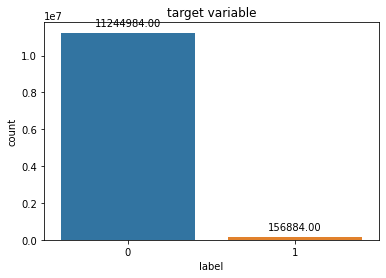

In [ ]:
import seaborn as sns

ax = sns.countplot(bpjs["label"])
for p in ax.patches:
   ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title("target variable")

## Jumlah transaksi biaya pada label 1

In [ ]:
label_1 = bpjs[bpjs['label'] == 1]

In [ ]:
label_0 = bpjs[bpjs['label'] == 0]

## Jumlah transaksi biaya pada label 1

In [ ]:
jumlah_notransaksi_biaya = label_1[label_1['biaya'] == -1].shape[0]
jumlah_transaksi0_biaya = label_1[label_1['biaya'] == 0].shape[0]
jumlah_transaksi_lebihdari_0_biaya = label_1[label_1['biaya'] > 0].shape[0]

print('Jumlah tanpa transaksi pada label 1 adalah sebanyak: ', jumlah_notransaksi_biaya)
print('Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi0_biaya)
print('Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi_lebihdari_0_biaya)

Jumlah tanpa transaksi pada label 1 adalah sebanyak:  0
Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak:  59474
Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak:  97410


## Jumlah biaya pada label 1 dan politujuan = IGD (modus)

In [ ]:
jumlah_notransaksi_biaya_1 = label_1[label_1['biaya'] == -1].shape[0]
jumlah_transaksi0_biaya_1 = label_1[label_1['biaya'] == 0].shape[0]
jumlah_transaksi_lebihdari_1_biaya_1 = label_1[label_1['biaya'] > 0].shape[0]

print('Jumlah tanpa transaksi pada label 1 adalah sebanyak: ', jumlah_notransaksi_biaya_1)
print('Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi0_biaya_1)
print('Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi_lebihdari_1_biaya_1)

Jumlah tanpa transaksi pada label 1 adalah sebanyak:  0
Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak:  59474
Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak:  97410


In [ ]:
jumlah_notransaksi_biaya_IGD = label_1[(label_1['biaya'] == -1) & (label_1['politujuan'] == 'IGD')].shape[0]
jumlah_transaksi0_biaya_IGD = label_1[label_1['biaya'] == 0 & (label_1['politujuan'] == 'IGD')].shape[0]
jumlah_transaksi_lebihdari_0_biaya_IGD = label_1[label_1['biaya'] > 0 & (label_1['politujuan'] == 'IGD')].shape[0]

print('Jumlah tanpa transaksi pada label 1 adalah sebanyak: ', jumlah_notransaksi_biaya_IGD)
print('Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi0_biaya_IGD)
print('Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak: ',jumlah_transaksi_lebihdari_0_biaya_IGD)

Jumlah tanpa transaksi pada label 1 adalah sebanyak:  0
Jumlah transaksi 0 rupiah pada label 1 adalah sebanyak:  59474
Jumlah transaksi lebih dari 0 rupiah pada label 1 adalah sebanyak:  97410


In [ ]:
jumlah_notransaksi_biaya_0 = label_0[label_0['biaya'] == -1].shape[0]
jumlah_transaksi0_biaya_0 = label_0[label_0['biaya'] == 0].shape[0]
jumlah_transaksi_lebihdari_0_biaya_0 = label_0[label_0['biaya'] > 0].shape[0]

print('Jumlah tanpa transaksi pada label 0 adalah sebanyak: ', jumlah_notransaksi_biaya_0)
print('Jumlah transaksi 0 rupiah pada label 0 adalah sebanyak: ',jumlah_transaksi0_biaya_0)
print('Jumlah transaksi lebih dari 0 rupiah pada label 0 adalah sebanyak: ',jumlah_transaksi_lebihdari_0_biaya_0)

Jumlah tanpa transaksi pada label 0 adalah sebanyak:  0
Jumlah transaksi 0 rupiah pada label 0 adalah sebanyak:  2996
Jumlah transaksi lebih dari 0 rupiah pada label 0 adalah sebanyak:  11241988


## label 0 biaya dan IGD

In [ ]:
jumlah_notransaksi_biaya_0_IGD = label_0[(label_0['biaya'] == -1) & (label_0['politujuan'] == 'IGD')].shape[0]
jumlah_transaksi0_biaya_0_IGD = label_0[label_0['biaya'] == 0 & (label_0['politujuan'] == 'IGD')].shape[0]
jumlah_transaksi_lebihdari_0_biaya_0_IGD = label_0[label_0['biaya'] > 0 & (label_0['politujuan'] == 'IGD')].shape[0]

print('Jumlah tanpa transaksi pada label 0 adalah sebanyak: ', jumlah_notransaksi_biaya_0_IGD)
print('Jumlah transaksi 0 rupiah pada label 0 adalah sebanyak: ',jumlah_transaksi0_biaya_0_IGD)
print('Jumlah transaksi lebih dari 0 rupiah pada label 0 adalah sebanyak: ',jumlah_transaksi_lebihdari_0_biaya_0_IGD)

Jumlah tanpa transaksi pada label 0 adalah sebanyak:  0
Jumlah transaksi 0 rupiah pada label 0 adalah sebanyak:  2996
Jumlah transaksi lebih dari 0 rupiah pada label 0 adalah sebanyak:  11241988


Berdasarkan data diatas sebanyak 35% tanpa transaksi bisa didefinisikan sebagai inefisiensi.

Berdasarkan 2 informasi diatas, berdasarkan keseluruhan data berdasarkan label, yang memiliki biaya > 0 memiliki jumlah data paling banyak. Ini berarti kita tidak bisa hanya bergantung pada biaya yang lebih dari 0 untuk menentukan efisiensi dan inefisiensi.

In [ ]:
label_0[(label_0['biaya'] > 0) & label_0['usia'] == 0]

,id,id_peserta,dati2,typefaskes,usia,jenkel,pisat,tgldatang,tglpulang,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,kdsa,kdsp,kdsr,kdsi,kdsd,label
0,165666,486,17,KL,48,P,1.0,2018-07-25T17:00:00.000Z,2018-07-25T17:00:00.000Z,2,THT,L02.8,184300.0,1.0,Q-5-42-0,3,NaN,NaN,NaN,NaN,NaN,0
3,168937,549,17,KL,54,P,1.0,2019-10-17T17:00:00.000Z,2019-10-17T17:00:00.000Z,2,MAT,H54.2,187300.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0
5,51010,663,8,SD,50,P,1.0,2018-12-26T17:00:00.000Z,2018-12-26T17:00:00.000Z,2,IGD,D61,155000.0,2.0,Q-5-33-0,3,NaN,NaN,NaN,NaN,NaN,0
6,49388,663,8,SD,50,P,1.0,2019-01-24T17:00:00.000Z,2019-01-24T17:00:00.000Z,2,IGD,D64.9,155000.0,2.0,Q-5-33-0,3,NaN,NaN,NaN,NaN,NaN,0
8,143197,736,17,KI,46,P,1.0,2020-04-19T17:00:00.000Z,2020-04-19T17:00:00.000Z,2,IGD,K30,186800.0,1.0,Q-5-42-0,3,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11401877,9983563,8527704,301,B,0,P,4.0,2020-12-30T17:00:00.000Z,2021-01-03T17:00:00.000Z,1,IGD,Z71.8,3645100.0,1.0,P-8-17-I,3,NaN,NaN,NaN,NaN,NaN,0
11401878,11053870,8527709,233,A,0,P,4.0,2020-12-30T17:00:00.000Z,2021-01-03T17:00:00.000Z,1,IGD,P59.9,12273200.0,1.0,P-8-13-II,2,NaN,NaN,NaN,NaN,NaN,0
11401879,7461049,8527751,118,B,0,L,4.0,2020-12-30T17:00:00.000Z,2021-01-06T17:00:00.000Z,1,IGD,P24.8,4099000.0,1.0,P-8-08-I,3,NaN,NaN,NaN,NaN,NaN,0
11401880,1075162,8527853,101,SC,0,L,5.0,2020-12-29T17:00:00.000Z,2020-12-31T17:00:00.000Z,1,IGD,P03,3992400.0,1.0,P-8-08-I,3,NaN,NaN,NaN,NaN,NaN,0


In [ ]:
label_1[(label_1['biaya'] > 0) & (label_1['usia'] == 0)].shape

(11143, 22)

In [ ]:
label_1[(label_1['biaya'] > 0) & (label_1['usia'] == 0) & (label_1['politujuan'] == 'IGD')].shape

(9377, 22)

In [ ]:
label_1_biayalebihdari0 = label_1[(label_1['biaya'] > 0)]
np.unique(label_1_biayalebihdari0['usia'], return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 102, 104, 105],
       dtype=int8),
 array([11143,  1256,  1011,   886,   855,   798,   758,   789,   701,
          722,   682,   665,   709,   666,   693,   749,   870,   908,
          993,  1003,   997,   911,   976,   998,   995,  1146,  1112,
         1054,  1048,  1001,   991,  1036,  1026,  1089,  1155,  1173,
         1136,  1203,  1257,  1165,  1176,  1257,  1194,  1234,  1324,
         1294,  1374,  1402,  1435,  1627,  1

In [ ]:
label_0_biayalebihdari0 = label_0[(label_0['biaya'] > 0)]
np.unique(label_0_biayalebihdari0['usia'], return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110], dtype=int8),
 array([829893, 197913, 154989, 130222, 120414, 118092, 114557, 106807,
         98787,  92718,  89536,  85632,  87000,  86654,  87630,  96846,
        105923, 113002, 120404, 123565, 125266, 114059, 122382, 130383,
        136116, 139389, 141032, 139388, 138502, 135364, 133920, 132650,
        134186, 138245, 140098, 143182, 146366, 147181, 148337, 147907,

Berdasarkan data umur dari kedua label, pasien lebih cenderung berumur 0 tahun pada keduanya.

## Print uniq dan count typefaskes pada label 1 dan 0

In [ ]:
np.unique(label_1['typefaskes'], return_counts=True)

(array(['A', 'B', 'C', 'D', 'GD', 'HD', 'I1', 'I2', 'I3', 'I4', 'KB', 'KC',
        'KG', 'KI', 'KJ', 'KL', 'KM', 'KO', 'KP', 'KT', 'KU', 'SA', 'SB',
        'SC', 'SD'], dtype=object),
 array([ 5535, 30387, 35425,  5312,   271,    14,   923,  2073,  3364,
         2195,   405,   104,    98,  4108,  1087,  1455,  6654,    89,
          136,    76,    51,   132,  8154, 35750, 13086]))

In [ ]:
# type(label_1['typefaskes'])

In [ ]:
np.unique(label_0['typefaskes'], return_counts=True)

(array(['A', 'B', 'C', 'D', 'GD', 'HD', 'I1', 'I2', 'I3', 'I4', 'KB', 'KC',
        'KG', 'KI', 'KJ', 'KK', 'KL', 'KM', 'KO', 'KP', 'KT', 'KU', 'SA',
        'SB', 'SC', 'SD'], dtype=object),
 array([ 487518, 2072319, 2161997,  255015,    9002,   14376,   49056,
         224397,  282414,  161911,   25074,   28813,   11036,  217003,
         172605,       9,  100478,  170363,   12715,   17714,    7299,
           4129,   17042,  800289, 3129807,  812603]))

## print top 10 uniq values di kolom politujuan pada label 0 dan 1 dengan biaya kurang dari 0 (missing values)

In [ ]:
from operator import itemgetter

def find_top_n_indices(data, top=3):
    indexed = enumerate(data)  # create pairs [(0, v1), (1, v2)...]
    sorted_data = sorted(indexed,
                         key=itemgetter(1),   # sort pairs by value
                         reverse=True)       # in reversed order
    return [d[0] for d in sorted_data[:top]]  # take first N indices

In [ ]:
label_1_politujuan_kurang0 = label_1[(label_1['biaya'] == -1)]
list_politujuan = list(np.unique(label_1_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[0])
list_jumlah_politujuan = list(np.unique(label_1_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[1])
list_top_politujuan = find_top_n_indices(list_jumlah_politujuan, top=20)
list_top_politujuan
for i in list_top_politujuan:
  print(list_politujuan[i], " dengan total jumlah ", list_jumlah_politujuan[i])

In [ ]:
label_0_politujuan_kurang0 = label_0[(label_0['biaya'] == -1)]
list_politujuan = list(np.unique(label_0_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[0])
list_jumlah_politujuan = list(np.unique(label_0_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[1])
list_top_politujuan = find_top_n_indices(list_jumlah_politujuan, top=20)
list_top_politujuan
for i in list_top_politujuan:
  print(list_politujuan[i], " dengan total jumlah ", list_jumlah_politujuan[i])

## print top 10 uniq values di kolom typefaskes pada label 0 dan 1 dengan biaya kurang dari 0 (missing values)

In [ ]:
label_0_typefaskes_kurang0 = label_0[(label_0['biaya'] == -1)]
list_typefaskes = list(np.unique(label_0_typefaskes_kurang0['typefaskes'].astype('category'), return_counts=True)[0])
list_jumlah_typefaskes = list(np.unique(label_0_typefaskes_kurang0['typefaskes'].astype('category'), return_counts=True)[1])
list_top_typefaskes = find_top_n_indices(list_jumlah_typefaskes, top=20)
list_top_typefaskes
for i in list_top_typefaskes:
  print(list_typefaskes[i], " dengan total jumlah ", list_jumlah_typefaskes[i])

In [ ]:
label_1_typefaskes_kurang0 = label_1[(label_1['biaya'] == -1)]
list_typefaskes = list(np.unique(label_1_typefaskes_kurang0['typefaskes'].astype('category'), return_counts=True)[0])
list_jumlah_typefaskes = list(np.unique(label_1_typefaskes_kurang0['typefaskes'].astype('category'), return_counts=True)[1])
list_top_typefaskes = find_top_n_indices(list_jumlah_typefaskes, top=20)
list_top_typefaskes
for i in list_top_typefaskes:
  print(list_typefaskes[i], " dengan total jumlah ", list_jumlah_typefaskes[i])

## Print top 10 uniq values di kolom diagfktp pada label 0 dan 1 dengan biaya kurang dari 0 (missing values)

In [ ]:
label_0_diagfktp_kurang0 = label_0[(label_0['biaya'] == -1)]
list_diagfktp = list(np.unique(label_0_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[0])
list_jumlah_diagfktp = list(np.unique(label_0_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[1])
list_top_diagfktp = find_top_n_indices(list_jumlah_diagfktp, top=20)
list_top_diagfktp
for i in list_top_diagfktp:
  print(list_diagfktp[i], " dengan total jumlah ", list_jumlah_diagfktp[i])

In [ ]:
label_1_diagfktp_kurang0 = label_1[(label_1['biaya'] == -1)]
list_diagfktp = list(np.unique(label_1_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[0])
list_jumlah_diagfktp = list(np.unique(label_1_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[1])
list_top_diagfktp = find_top_n_indices(list_jumlah_diagfktp, top=20)
list_top_diagfktp
for i in list_top_diagfktp:
  print(list_diagfktp[i], " dengan total jumlah ", list_jumlah_diagfktp[i])

## print top 10 uniq values di kolom kelasrawat pada label 0 dan 1 dengan biaya kurang dari 0 (missing values)

In [ ]:
label_0_kelasrawat_kurang0 = label_0[(label_0['biaya'] == -1)]
list_kelasrawat = list(np.unique(label_0_kelasrawat_kurang0['kelasrawat'].astype('category'), return_counts=True)[0])
list_jumlah_kelasrawat = list(np.unique(label_0_kelasrawat_kurang0['kelasrawat'].astype('category'), return_counts=True)[1])
list_top_kelasrawat = find_top_n_indices(list_jumlah_kelasrawat, top=20)
list_top_kelasrawat
for i in list_top_kelasrawat:
  print(list_kelasrawat[i], " dengan total jumlah ", list_jumlah_kelasrawat[i])

In [ ]:
label_1_kelasrawat_kurang0 = label_1[(label_1['biaya'] == -1)]
list_kelasrawat = list(np.unique(label_1_kelasrawat_kurang0['kelasrawat'].astype('category'), return_counts=True)[0])
list_jumlah_kelasrawat = list(np.unique(label_1_kelasrawat_kurang0['kelasrawat'].astype('category'), return_counts=True)[1])
list_top_kelasrawat = find_top_n_indices(list_jumlah_kelasrawat, top=20)
list_top_kelasrawat
for i in list_top_kelasrawat:
  print(list_kelasrawat[i], " dengan total jumlah ", list_jumlah_kelasrawat[i])

## print top 10 uniq values dikolom jenispel pada label 0 dan 1 dengan biaya kurang dari 0 (missing values)

In [ ]:
label_0_jenispel_kurang0 = label_0[(label_0['biaya'] == -1)]
list_jenispel = list(np.unique(label_0_jenispel_kurang0['jenispel'].astype('category'), return_counts=True)[0])
list_jumlah_jenispel = list(np.unique(label_0_jenispel_kurang0['jenispel'].astype('category'), return_counts=True)[1])
list_top_jenispel = find_top_n_indices(list_jumlah_jenispel, top=20)
list_top_jenispel
for i in list_top_jenispel:
  print(list_jenispel[i], " dengan total jumlah ", list_jumlah_jenispel[i])

In [ ]:
label_1_jenispel_kurang0 = label_1[(label_1['biaya'] == -1)]
list_jenispel = list(np.unique(label_1_jenispel_kurang0['jenispel'].astype('category'), return_counts=True)[0])
list_jumlah_jenispel = list(np.unique(label_1_jenispel_kurang0['jenispel'].astype('category'), return_counts=True)[1])
list_top_jenispel = find_top_n_indices(list_jumlah_jenispel, top=20)
list_top_jenispel
for i in list_top_jenispel:
  print(list_jenispel[i], " dengan total jumlah ", list_jumlah_jenispel[i])

## print top 10 uniq values dikolom politujuan pada label 0 dan 1 biaya > 0

In [ ]:
label_0_politujuan_kurang0 = label_0[(label_0['biaya'] > 0)]
list_politujuan = list(np.unique(label_0_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[0])
list_jumlah_politujuan = list(np.unique(label_0_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[1])
list_top_politujuan = find_top_n_indices(list_jumlah_politujuan, top=20)
list_top_politujuan
for i in list_top_politujuan:
  print(list_politujuan[i], " dengan total jumlah ", list_jumlah_politujuan[i])

IGD  dengan total jumlah  5533891
INT  dengan total jumlah  819121
MAT  dengan total jumlah  616089
SAR  dengan total jumlah  599094
THT  dengan total jumlah  481972
ANA  dengan total jumlah  474174
BED  dengan total jumlah  434119
JIW  dengan total jumlah  315513
KLT  dengan total jumlah  271582
OBG  dengan total jumlah  224414
IRM  dengan total jumlah  218700
JAN  dengan total jumlah  180622
ORT  dengan total jumlah  173804
HDL  dengan total jumlah  148634
GIG  dengan total jumlah  138072
PAR  dengan total jumlah  119020
URO  dengan total jumlah  87824
UGD  dengan total jumlah  75031
FIS  dengan total jumlah  34687
017  dengan total jumlah  34427


In [ ]:
label_1_politujuan_kurang0 = label_1[(label_1['biaya'] > 0)]
list_politujuan = list(np.unique(label_1_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[0])
list_jumlah_politujuan = list(np.unique(label_1_politujuan_kurang0['politujuan'].astype('category'), return_counts=True)[1])
list_top_politujuan = find_top_n_indices(list_jumlah_politujuan, top=20)
list_top_politujuan
for i in list_top_politujuan:
  print(list_politujuan[i], " dengan total jumlah ", list_jumlah_politujuan[i])

IGD  dengan total jumlah  44687
MAT  dengan total jumlah  12037
INT  dengan total jumlah  6802
JIW  dengan total jumlah  5732
SAR  dengan total jumlah  4780
ANA  dengan total jumlah  4164
BED  dengan total jumlah  3705
JAN  dengan total jumlah  2646
THT  dengan total jumlah  2093
IRM  dengan total jumlah  1928
OBG  dengan total jumlah  1296
KLT  dengan total jumlah  1274
PAR  dengan total jumlah  1189
ORT  dengan total jumlah  943
UGD  dengan total jumlah  719
GIG  dengan total jumlah  651
URO  dengan total jumlah  523
FIS  dengan total jumlah  271
BDM  dengan total jumlah  261
017  dengan total jumlah  198


## print top 10 uniq values di kolom kelasrawat pada label 0 dan 1 biaya > 0

In [ ]:
label_0_diagfktp_kurang0 = label_0[(label_0['biaya'] > 0)]
list_diagfktp = list(np.unique(label_0_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[0])
list_jumlah_diagfktp = list(np.unique(label_0_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[1])
list_top_diagfktp = find_top_n_indices(list_jumlah_diagfktp, top=20)
list_top_diagfktp
for i in list_top_diagfktp:
  print(list_diagfktp[i], " dengan total jumlah ", list_jumlah_diagfktp[i])

Z09.8  dengan total jumlah  403571
R50.9  dengan total jumlah  342813
Z03.8  dengan total jumlah  199011
P03.4  dengan total jumlah  198674
K30  dengan total jumlah  181602
M54.5  dengan total jumlah  122438
R10.4  dengan total jumlah  116005
F20  dengan total jumlah  102685
Z03.9  dengan total jumlah  88821
I64  dengan total jumlah  88470
D64.9  dengan total jumlah  87522
R11  dengan total jumlah  84065
H52.7  dengan total jumlah  79691
A09  dengan total jumlah  79674
D56.9  dengan total jumlah  79333
I50.0  dengan total jumlah  78568
R06.0  dengan total jumlah  76744
Z00.0  dengan total jumlah  71366
N18  dengan total jumlah  66680
I10  dengan total jumlah  66449


In [ ]:
label_1_diagfktp_kurang0 = label_1[(label_1['biaya'] > 0)]
list_diagfktp = list(np.unique(label_1_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[0])
list_jumlah_diagfktp = list(np.unique(label_1_diagfktp_kurang0['diagfktp'].astype('category'), return_counts=True)[1])
list_top_diagfktp = find_top_n_indices(list_jumlah_diagfktp, top=20)
list_top_diagfktp
for i in list_top_diagfktp:
  print(list_diagfktp[i], " dengan total jumlah ", list_jumlah_diagfktp[i])

P03.4  dengan total jumlah  4116
Z09.8  dengan total jumlah  3853
R50.9  dengan total jumlah  2102
Z03.8  dengan total jumlah  1755
H52.7  dengan total jumlah  1546
I50.0  dengan total jumlah  1529
F20  dengan total jumlah  1469
K30  dengan total jumlah  1423
Z09.0  dengan total jumlah  956
H52.1  dengan total jumlah  932
I64  dengan total jumlah  859
G20  dengan total jumlah  831
F20.9  dengan total jumlah  818
M54.5  dengan total jumlah  786
H54.2  dengan total jumlah  758
D56.9  dengan total jumlah  744
F20.0  dengan total jumlah  737
R10.4  dengan total jumlah  730
Z00.0  dengan total jumlah  678
H26.9  dengan total jumlah  637


## print uniq dan jumlahnya kolom cbg pada label 0 atau 1

In [ ]:
# np.unique(label_1['cbg'].astype('category'), return_counts=True)

In [ ]:
list_dati2 = list(np.unique(label_1['cbg'].astype('category'), return_counts=True)[0])
list_jumlah_dati2 = list(np.unique(label_1['cbg'].astype('category'), return_counts=True)[1])
list_top_dati2 = find_top_n_indices(list_jumlah_dati2, top=20)
list_top_dati2
for i in list_top_dati2:
  print(list_dati2[i], " dengan total jumlah ", list_jumlah_dati2[i])

Q-5-44-0  dengan total jumlah  25654
Q-5-42-0  dengan total jumlah  12695
P-8-17-I  dengan total jumlah  11742
H-3-12-0  dengan total jumlah  9212
Q-5-43-0  dengan total jumlah  6433
F-5-14-0  dengan total jumlah  5303
K-5-18-0  dengan total jumlah  3230
D-4-13-I  dengan total jumlah  3080
Q-5-29-0  dengan total jumlah  2568
G-5-17-0  dengan total jumlah  2364
Q-5-25-0  dengan total jumlah  2247
Z-3-25-0  dengan total jumlah  1952
J-3-13-0  dengan total jumlah  1940
Z-3-23-0  dengan total jumlah  1788
H-3-13-0  dengan total jumlah  1715
L-1-40-I  dengan total jumlah  1638
Q-5-41-0  dengan total jumlah  1531
P-8-13-I  dengan total jumlah  1416
F-5-10-0  dengan total jumlah  1394
P-8-08-I  dengan total jumlah  1142


In [ ]:
# label_1[(label_1['biaya'] == -1) & (label_1['politujuan'] == 'IGD') & (label_1['cbg'] == 'P-8-17-I')].shape[0]

In [ ]:
list_dati2 = list(np.unique(label_0['cbg'].astype('category'), return_counts=True)[0])
list_jumlah_dati2 = list(np.unique(label_0['cbg'].astype('category'), return_counts=True)[1])
list_top_dati2 = find_top_n_indices(list_jumlah_dati2, top=10)
list_top_dati2
for i in list_top_dati2:
  print(list_dati2[i], " dengan total jumlah ", list_jumlah_dati2[i])

Q-5-44-0  dengan total jumlah  2653193
Q-5-42-0  dengan total jumlah  999864
F-5-14-0  dengan total jumlah  284106
P-8-17-I  dengan total jumlah  236597
U-3-15-0  dengan total jumlah  218566
D-4-13-I  dengan total jumlah  200320
O-6-10-I  dengan total jumlah  187695
H-3-12-0  dengan total jumlah  178252
M-3-16-0  dengan total jumlah  174368
K-5-18-0  dengan total jumlah  167610


In [ ]:
list_dati2 = list(np.unique(label_1['dati2'].astype('category'), return_counts=True)[0])
list_jumlah_dati2 = np.unique(label_1['dati2'].astype('category'), return_counts=True)[1]
list_top_dati2 = find_top_n_indices(list_jumlah_dati2, top=5)
for i in list_top_dati2:
  print(list_dati2.index(i))

213
82
299
209
165


In [ ]:
# q = np.unique(label_1['typefaskes'], return_counts=True)[0]
# qq = np.unique(label_1['politujuan'], return_counts=True)[1]
# qq.tolist()[q.tolist().index('IGD')]

In [ ]:
# qq.tolist()[q.tolist().index('IGD')]

In [ ]:
# q = np.unique(label_1['politujuan'], return_counts=True)[0]
# qq = np.unique(label_1['politujuan'], return_counts=True)[1]
# qq.tolist()[q.tolist().index('IGD')]

## Jumlah kelamin berdasarkan label



In [ ]:
len_jenkel_P_0 = label_0[label_0['jenkel'] == 'P'].shape[0]
len_jenkel_L_0 = label_0[label_0['jenkel'] == 'L'].shape[0]
len_jenkel_P_1 = label_1[label_1['jenkel'] == 'P'].shape[0]
len_jenkel_L_1 = label_1[label_1['jenkel'] == 'L'].shape[0]

print('Jumlah Perempuan pada label 0 adalah: ', len_jenkel_P_0)
print('Jumlah Laki-Laki pada label 0 adalah: ', len_jenkel_L_0)
print('Jumlah Perempuan pada label 1 adalah: ', len_jenkel_P_1)
print('Jumlah Laki-Laki pada label 1 adalah: ', len_jenkel_L_1)

Jumlah Perempuan pada label 0 adalah:  6079327
Jumlah Laki-Laki pada label 0 adalah:  5165657
Jumlah Perempuan pada label 1 adalah:  82390
Jumlah Laki-Laki pada label 1 adalah:  74494


Berdasarkan hasil diatas jenis kelamin tidak terlalu berpengaruh pada penentuan inefisiensi dan efisiensi.

## Jumlah pisat berdasarkan label

In [ ]:
bpjs['pisat'].astype('category').unique()

/usr/local/lib/python3.7/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


[1.0, 2.0, 4.0, 3.0, 5.0]
Categories (5, float64): [1.0, 2.0, 3.0, 4.0, 5.0]

In [ ]:
len_pisat_1_0 = label_0[label_0['pisat'] == 1].shape[0]
len_pisat_2_0 = label_0[label_0['pisat'] == 2].shape[0]
len_pisat_3_0 = label_0[label_0['pisat'] == 3].shape[0]
len_pisat_4_0 = label_0[label_0['pisat'] == 4].shape[0]
len_pisat_5_0 = label_0[label_0['pisat'] == 5].shape[0]
len_pisat_1_1 = label_1[label_1['pisat'] == 1].shape[0]
len_pisat_2_1 = label_1[label_1['pisat'] == 2].shape[0]
len_pisat_3_1 = label_1[label_1['pisat'] == 3].shape[0]
len_pisat_4_1 = label_1[label_1['pisat'] == 4].shape[0]
len_pisat_5_1 = label_1[label_1['pisat'] == 5].shape[0]

print('Jumlah Pisat 1 pada label 0 adalah: ', len_pisat_1_0)
print('Jumlah Pisat 2 pada label 0 adalah: ', len_pisat_2_0)
print('Jumlah Pisat 3 pada label 0 adalah: ', len_pisat_3_0)
print('Jumlah Pisat 4 pada label 0 adalah: ', len_pisat_4_0)
print('Jumlah Pisat 5 pada label 0 adalah: ', len_pisat_5_0)
print('Jumlah Pisat 1 pada label 1 adalah: ', len_pisat_1_1)
print('Jumlah Pisat 2 pada label 1 adalah: ', len_pisat_2_1)
print('Jumlah Pisat 3 pada label 1 adalah: ', len_pisat_3_1)
print('Jumlah Pisat 4 pada label 1 adalah: ', len_pisat_4_1)
print('Jumlah Pisat 5 pada label 1 adalah: ', len_pisat_5_1)

Jumlah Pisat 1 pada label 0 adalah:  4810775
Jumlah Pisat 2 pada label 0 adalah:  239309
Jumlah Pisat 3 pada label 0 adalah:  2443464
Jumlah Pisat 4 pada label 0 adalah:  3299298
Jumlah Pisat 5 pada label 0 adalah:  452138
Jumlah Pisat 1 pada label 1 adalah:  63574
Jumlah Pisat 2 pada label 1 adalah:  3223
Jumlah Pisat 3 pada label 1 adalah:  31391
Jumlah Pisat 4 pada label 1 adalah:  51437
Jumlah Pisat 5 pada label 1 adalah:  7259


Berdasarkan hasil diatas pisat 1,4,3,5,2 pada kedua label memiliki jumlah tertinggi.

## Jumlah jenispel berdasarkan label

In [ ]:
bpjs['jenispel'].astype('category').unique()

[2, 1]
Categories (2, int64): [1, 2]

In [ ]:
len_jenispel_1_0 = label_0[label_0['jenispel'] == 1].shape[0]
len_jenispel_2_0 = label_0[label_0['jenispel'] == 2].shape[0]
len_jenispel_1_1 = label_1[label_1['jenispel'] == 1].shape[0]
len_jenispel_2_1 = label_1[label_1['jenispel'] == 2].shape[0]

print('Jumlah jenispel 1 pada label 0 adalah: ', len_jenispel_1_0)
print('Jumlah jenispel 2 pada label 0 adalah: ', len_jenispel_2_0)
print('Jumlah jenispel 1 pada label 1 adalah: ', len_jenispel_1_1)
print('Jumlah jenispel 2 pada label 1 adalah: ', len_jenispel_2_1)

Jumlah jenispel 1 pada label 0 adalah:  3987891
Jumlah jenispel 2 pada label 0 adalah:  7257093
Jumlah jenispel 1 pada label 1 adalah:  53566
Jumlah jenispel 2 pada label 1 adalah:  103318


## Jumlah jenispulang berdasarkan label

In [ ]:
bpjs['jenispulang'].astype('category').unique()

[1.0, 2.0, 4.0, 5.0, 3.0]
Categories (5, float64): [1.0, 2.0, 3.0, 4.0, 5.0]

In [ ]:
len_jenispulang_1_0 = label_0[label_0['jenispulang'] == 1].shape[0]
len_jenispulang_2_0 = label_0[label_0['jenispulang'] == 2].shape[0]
len_jenispulang_3_0 = label_0[label_0['jenispulang'] == 3].shape[0]
len_jenispulang_4_0 = label_0[label_0['jenispulang'] == 4].shape[0]
len_jenispulang_5_0 = label_0[label_0['jenispulang'] == 5].shape[0]
len_jenispulang_1_1 = label_1[label_1['jenispulang'] == 1].shape[0]
len_jenispulang_2_1 = label_1[label_1['jenispulang'] == 2].shape[0]
len_jenispulang_3_1 = label_1[label_1['jenispulang'] == 3].shape[0]
len_jenispulang_4_1 = label_1[label_1['jenispulang'] == 4].shape[0]
len_jenispulang_5_1 = label_1[label_1['jenispulang'] == 5].shape[0]

print('Jumlah jenispulang 1 pada label 0 adalah: ', len_jenispulang_1_0)
print('Jumlah jenispulang 2 pada label 0 adalah: ', len_jenispulang_2_0)
print('Jumlah jenispulang 3 pada label 0 adalah: ', len_jenispulang_3_0)
print('Jumlah jenispulang 4 pada label 0 adalah: ', len_jenispulang_4_0)
print('Jumlah jenispulang 5 pada label 0 adalah: ', len_jenispulang_5_0)
print('Jumlah jenispulang 1 pada label 1 adalah: ', len_jenispulang_1_1)
print('Jumlah jenispulang 2 pada label 1 adalah: ', len_jenispulang_2_1)
print('Jumlah jenispulang 3 pada label 1 adalah: ', len_jenispulang_3_1)
print('Jumlah jenispulang 4 pada label 1 adalah: ', len_jenispulang_4_1)
print('Jumlah jenispulang 5 pada label 1 adalah: ', len_jenispulang_5_1)

Jumlah jenispulang 1 pada label 0 adalah:  10779396
Jumlah jenispulang 2 pada label 0 adalah:  182319
Jumlah jenispulang 3 pada label 0 adalah:  52839
Jumlah jenispulang 4 pada label 0 adalah:  144349
Jumlah jenispulang 5 pada label 0 adalah:  86081
Jumlah jenispulang 1 pada label 1 adalah:  150223
Jumlah jenispulang 2 pada label 1 adalah:  3395
Jumlah jenispulang 3 pada label 1 adalah:  745
Jumlah jenispulang 4 pada label 1 adalah:  1767
Jumlah jenispulang 5 pada label 1 adalah:  754


Berdasarkan hasil jenispulang diatas urutan tertinggi dari kedua label sama, mulai dari 1,2,4,5,3

## Jumlah kelasrawat berdasarkan label

In [ ]:
bpjs['kelasrawat'].astype('category').unique()

[3, 1, 2]
Categories (3, int64): [1, 2, 3]

In [ ]:
len_kelasrawat_1_0 = label_0[label_0['kelasrawat'] == 1].shape[0]
len_kelasrawat_2_0 = label_0[label_0['kelasrawat'] == 2].shape[0]
len_kelasrawat_3_0 = label_0[label_0['kelasrawat'] == 3].shape[0]
len_kelasrawat_1_1 = label_1[label_1['kelasrawat'] == 1].shape[0]
len_kelasrawat_2_1 = label_1[label_1['kelasrawat'] == 2].shape[0]
len_kelasrawat_3_1 = label_1[label_1['kelasrawat'] == 3].shape[0]

print('Jumlah kelasrawat 1 pada label 0 adalah: ', len_kelasrawat_1_0)
print('Jumlah kelasrawat 2 pada label 0 adalah: ', len_kelasrawat_2_0)
print('Jumlah kelasrawat 3 pada label 0 adalah: ', len_kelasrawat_3_0)
print('Jumlah kelasrawat 1 pada label 1 adalah: ', len_kelasrawat_1_1)
print('Jumlah kelasrawat 2 pada label 1 adalah: ', len_kelasrawat_2_1)
print('Jumlah kelasrawat 3 pada label 1 adalah: ', len_kelasrawat_3_1)

Jumlah kelasrawat 1 pada label 0 adalah:  757674
Jumlah kelasrawat 2 pada label 0 adalah:  902493
Jumlah kelasrawat 3 pada label 0 adalah:  9584817
Jumlah kelasrawat 1 pada label 1 adalah:  10894
Jumlah kelasrawat 2 pada label 1 adalah:  15242
Jumlah kelasrawat 3 pada label 1 adalah:  130748


Berdasarkan hasil diatas kedua label memiliki nilai tertinggi yang sama mulai dari kelasrawat 3,2,1

## Jumlah lama_waktu_hari dirumah sakit (dalam hari)

ps: run feature engineering lama_waktu_hari terlebih dahulu

In [ ]:
label_0_baru = bpjs[bpjs['label'] == 0]
label_1_baru = bpjs[bpjs['label'] == 1]

In [ ]:
# len_lama_waktu_0_hari_0 = label_0_baru[label_0_baru['lama_waktu_hari'] == 0].shape[0]
# len_lama_waktu_lebihdari0_hari_0 = label_0_baru[label_0_baru['lama_waktu_hari'] > 0].shape[0]
# len_lama_waktu_0_hari_1 = label_1_baru[label_1_baru['lama_waktu_hari'] == 0].shape[0]
# len_lama_waktu_lebihdari0_hari_1 = label_1_baru[label_1_baru['lama_waktu_hari'] > 0].shape[0]

# print('Lama waktu 0 hari pada label 0 adalah: ', len_lama_waktu_0_hari_0)
# print('Lama waktu lebih dari 0 hari pada label 0 adalah: ', len_lama_waktu_lebihdari0_hari_0)
# print('Lama waktu 0 hari pada label 1 adalah: ', len_lama_waktu_0_hari_1)
# print('Lama waktu lebih dari 0 hari pada label 1 adalah: ', len_lama_waktu_lebihdari0_hari_1)

Berdasarkaan plot diatas, dapat dikatakan dalam dataset, jenis kelamin paling banyak adalah jenis kelamin P (Perempuan)

In [ ]:
bpjs.jenkel.value_counts()

P    6161717
L    5240151
Name: jenkel, dtype: int64

In [ ]:
bpjs1 = bpjs[bpjs['label']==1]

In [ ]:
# with plt.style.context('seaborn'):
#   plt.figure(figsize=(10,8))
#   fig = bpjs.jenkel[bpjs['label']==1].value_counts().plot(kind='bar', color=['lightgreen','coral'])

#   for p in fig.patches:
#     width = p.get_width()
#     height = p.get_height()
#     x, y = p.get_xy()
#     fig.annotate(f'{str(round((height*100)/bpjs1.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
#   # Providing the labels and title to the graph
#   plt.xlabel("Jenis Kelamain", fontdict=label_font_dict)
#   plt.ylabel("Jumlah", fontdict=label_font_dict)
#   plt.grid(which='major', linestyle="--", color='lightgrey')
#   plt.minorticks_on()
#   plt.title("Distribusi inefisiensi berdasarkan jenis kelamin\n", fontdict=title_font_dict)

# Feature Engineering

In [ ]:
bpjs['tgldatang'] = bpjs['tgldatang'].astype('datetime64[ns]')
bpjs['tglpulang'] = bpjs['tglpulang'].astype('datetime64[ns]')
bpjs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11401868 entries, 0 to 11401881
Data columns (total 22 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   id_peserta   int64         
 2   dati2        int16         
 3   typefaskes   category      
 4   usia         int8          
 5   jenkel       category      
 6   pisat        float64       
 7   tgldatang    datetime64[ns]
 8   tglpulang    datetime64[ns]
 9   jenispel     int8          
 10  politujuan   category      
 11  diagfktp     object        
 12  biaya        float64       
 13  jenispulang  float64       
 14  cbg          category      
 15  kelasrawat   int8          
 16  kdsa         category      
 17  kdsp         category      
 18  kdsr         category      
 19  kdsi         category      
 20  kdsd         category      
 21  label        int64         
dtypes: category(9), datetime64[ns](2), float64(3), int16(1), int64(3), int8(3), object(1)
me

In [ ]:
bpjs['lama_waktu_hari'] = (bpjs['tglpulang'] - bpjs['tgldatang']).dt.days
bpjs

,id,id_peserta,dati2,typefaskes,usia,jenkel,pisat,tgldatang,tglpulang,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,kdsa,kdsp,kdsr,kdsi,kdsd,label,lama_waktu_hari
0,165666,486,17,KL,48,P,1.0,2018-07-25 17:00:00,2018-07-25 17:00:00,2,THT,L02.8,184300.0,1.0,Q-5-42-0,3,NaN,NaN,NaN,NaN,NaN,0,0
1,1010828,520,17,A,63,L,1.0,2019-05-27 17:00:00,2019-05-30 17:00:00,1,IGD,R23.1,10628400.0,1.0,D-4-13-III,1,NaN,NaN,NaN,NaN,NaN,0,3
2,166042,523,17,KL,53,P,1.0,2019-07-16 17:00:00,2019-07-16 17:00:00,2,INT,E10.5,187300.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0,0
3,168937,549,17,KL,54,P,1.0,2019-10-17 17:00:00,2019-10-17 17:00:00,2,MAT,H54.2,187300.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0,0
4,1005899,549,17,A,53,P,1.0,2018-04-18 17:00:00,2018-04-18 17:00:00,2,SAR,M54.5,381600.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11401877,9983563,8527704,301,B,0,P,4.0,2020-12-30 17:00:00,2021-01-03 17:00:00,1,IGD,Z71.8,3645100.0,1.0,P-8-17-I,3,NaN,NaN,NaN,NaN,NaN,0,4
11401878,11053870,8527709,233,A,0,P,4.0,2020-12-30 17:00:00,2021-01-03 17:00:00,1,IGD,P59.9,12273200.0,1.0,P-8-13-II,2,NaN,NaN,NaN,NaN,NaN,0,4
11401879,7461049,8527751,118,B,0,L,4.0,2020-12-30 17:00:00,2021-01-06 17:00:00,1,IGD,P24.8,4099000.0,1.0,P-8-08-I,3,NaN,NaN,NaN,NaN,NaN,0,7
11401880,1075162,8527853,101,SC,0,L,5.0,2020-12-29 17:00:00,2020-12-31 17:00:00,1,IGD,P03,3992400.0,1.0,P-8-08-I,3,NaN,NaN,NaN,NaN,NaN,0,2


In [ ]:
bpjs['diagfktp'] = bpjs['diagfktp'].str.upper()
bpjs['cbg'] = bpjs['cbg'].str.upper()
bpjs['typefaskes'] = bpjs['typefaskes'].str.upper()
bpjs['politujuan'] = bpjs['politujuan'].str.upper()

In [ ]:
bpjs = bpjs.drop(['id_peserta', 'kdsa' , 'kdsp', 'kdsr', 'kdsi', 'kdsd','tgldatang', 'tglpulang'], axis=1)
bpjs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11401868 entries, 0 to 11401881
Data columns (total 15 columns):
 #   Column           Dtype   
---  ------           -----   
 0   id               int64   
 1   dati2            int16   
 2   typefaskes       object  
 3   usia             int8    
 4   jenkel           category
 5   pisat            float64 
 6   jenispel         int8    
 7   politujuan       object  
 8   diagfktp         object  
 9   biaya            float64 
 10  jenispulang      float64 
 11  cbg              object  
 12  kelasrawat       int8    
 13  label            int64   
 14  lama_waktu_hari  int64   
dtypes: category(1), float64(3), int16(1), int64(3), int8(3), object(4)
memory usage: 1022.1+ MB


In [ ]:
cols_list = bpjs.columns
print(len(bpjs['label'].unique()))

for i in cols_list:
  print(i, ' memiliki jumlah nilai uniq sebanyak ', len(bpjs[i].unique()))

2
id  memiliki jumlah nilai uniq sebanyak  11401868
dati2  memiliki jumlah nilai uniq sebanyak  489
typefaskes  memiliki jumlah nilai uniq sebanyak  26
usia  memiliki jumlah nilai uniq sebanyak  111
jenkel  memiliki jumlah nilai uniq sebanyak  2
pisat  memiliki jumlah nilai uniq sebanyak  5
jenispel  memiliki jumlah nilai uniq sebanyak  2
politujuan  memiliki jumlah nilai uniq sebanyak  235
diagfktp  memiliki jumlah nilai uniq sebanyak  15383
biaya  memiliki jumlah nilai uniq sebanyak  57854
jenispulang  memiliki jumlah nilai uniq sebanyak  5
cbg  memiliki jumlah nilai uniq sebanyak  1034
kelasrawat  memiliki jumlah nilai uniq sebanyak  3
label  memiliki jumlah nilai uniq sebanyak  2
lama_waktu_hari  memiliki jumlah nilai uniq sebanyak  508


In [ ]:
# print(bpjs.apply(lambda col: col.unique()).lama_waktu_hari.max())

# Modelling

In [ ]:
bpjs = pd.get_dummies(data=bpjs, columns=['jenkel'])
bpjs.head()

,id,dati2,typefaskes,usia,pisat,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,label,lama_waktu_hari,jenkel_L,jenkel_P
0,165666,17,KL,48,1.0,2,THT,L02.8,184300.0,1.0,Q-5-42-0,3,0,0,0,1
1,1010828,17,A,63,1.0,1,IGD,R23.1,10628400.0,1.0,D-4-13-III,1,0,3,1,0
2,166042,17,KL,53,1.0,2,INT,E10.5,187300.0,1.0,Q-5-44-0,3,0,0,0,1
3,168937,17,KL,54,1.0,2,MAT,H54.2,187300.0,1.0,Q-5-44-0,3,0,0,0,1
4,1005899,17,A,53,1.0,2,SAR,M54.5,381600.0,1.0,Q-5-44-0,3,0,0,0,1


In [ ]:
print(len(bpjs['diagfktp'].unique()))
bpjs['diagfktp'] = bpjs['diagfktp'].str.replace(".0$", '', regex=True)
print(len(bpjs['diagfktp'].unique()))

15383
13353


In [ ]:
bpjs_copy = bpjs.copy()

In [ ]:
# bpjs_copy = bpjs_copy.drop(['dati2'], axis=1)
# bpjs_copy = bpjs_copy.drop(['diagfktp'], axis=1)
bpjs_copy

,id,dati2,typefaskes,usia,pisat,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,label,lama_waktu_hari,jenkel_L,jenkel_P
0,165666,17,KL,48,1.0,2,THT,L02.8,184300.0,1.0,Q-5-42-0,3,0,0,0,1
1,1010828,17,A,63,1.0,1,IGD,R23.1,10628400.0,1.0,D-4-13-III,1,0,3,1,0
2,166042,17,KL,53,1.0,2,INT,E10.5,187300.0,1.0,Q-5-44-0,3,0,0,0,1
3,168937,17,KL,54,1.0,2,MAT,H54.2,187300.0,1.0,Q-5-44-0,3,0,0,0,1
4,1005899,17,A,53,1.0,2,SAR,M54.5,381600.0,1.0,Q-5-44-0,3,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11401877,9983563,301,B,0,4.0,1,IGD,Z71.8,3645100.0,1.0,P-8-17-I,3,0,4,0,1
11401878,11053870,233,A,0,4.0,1,IGD,P59.9,12273200.0,1.0,P-8-13-II,2,0,4,0,1
11401879,7461049,118,B,0,4.0,1,IGD,P24.8,4099000.0,1.0,P-8-08-I,3,0,7,1,0
11401880,1075162,101,SC,0,5.0,1,IGD,P03,3992400.0,1.0,P-8-08-I,3,0,2,1,0


In [ ]:
# from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# ohe = OneHotEncoder(handle_unknown='ignore')
# bpjs_copy['jenkel'] = ohe.fit_transform(bpjs_copy['jenkel']).toarray()
# bpjs_copy

In [ ]:
!pip install --upgrade category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from category_encoders import TargetEncoder

encoder = TargetEncoder()
bpjs_copy[['typefaskes Encoded', 'politujuan Encoded', 'diagfktp Encoded','cbg Encoded']] = encoder.fit_transform(bpjs_copy[['typefaskes', 'politujuan', 'diagfktp','cbg']], bpjs_copy['label'])
# bpjs_copy[] = encoder.fit_transform(bpjs_copy['politujuan'], bpjs_copy['label'])
# bpjs_copy[] = encoder.fit_transform(bpjs_copy['diagfktp'], bpjs_copy['label'])
# bpjs_copy['cbg Encoded'] = encoder.fit_transform(bpjs_copy['cbg'], bpjs_copy['label'])

/usr/local/lib/python3.7/dist-packages/category_encoders/target_encoder.py:124: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/category_encoders/target_encoder.py:129: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [ ]:
bpjs_copy = bpjs_copy.drop(['typefaskes', 'diagfktp', 'politujuan', 'cbg'], axis=1)
bpjs_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11401868 entries, 0 to 11401881
Data columns (total 16 columns):
 #   Column              Dtype  
---  ------              -----  
 0   id                  int64  
 1   dati2               int16  
 2   usia                int8   
 3   pisat               float64
 4   jenispel            int8   
 5   biaya               float64
 6   jenispulang         float64
 7   kelasrawat          int8   
 8   label               int64  
 9   lama_waktu_hari     int64  
 10  jenkel_L            uint8  
 11  jenkel_P            uint8  
 12  typefaskes Encoded  float64
 13  politujuan Encoded  float64
 14  diagfktp Encoded    float64
 15  cbg Encoded         float64
dtypes: float64(7), int16(1), int64(3), int8(3), uint8(2)
memory usage: 1.0 GB


In [ ]:
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# cols_list = ['typefaskes', 'diagfktp', 'cbg', 'politujuan']
# bpjs_copy[cols_list] = bpjs_copy[cols_list].apply(le.fit_transform)
# bpjs_copy


In [ ]:
data_id = bpjs_copy.pop('id')
Y = bpjs_copy.pop('label')
X = bpjs_copy

In [ ]:
X

,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P,typefaskes Encoded,politujuan Encoded,diagfktp Encoded,cbg Encoded
0,17,48,1.0,2,184300.0,1.0,3,0,0,1,0.014274,0.006697,2.045210e-02,0.012538
1,17,63,1.0,1,10628400.0,1.0,1,3,1,0,0.011226,0.013253,1.043322e-11,0.022685
2,17,53,1.0,2,187300.0,1.0,3,0,0,1,0.014274,0.013696,9.463722e-03,0.009577
3,17,54,1.0,2,187300.0,1.0,3,0,0,1,0.014274,0.022565,3.193740e-02,0.009577
4,17,53,1.0,2,381600.0,1.0,3,0,0,1,0.011226,0.010822,9.479094e-03,0.009577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11401877,301,0,4.0,1,3645100.0,1.0,3,4,0,1,0.014451,0.013253,5.680825e-03,0.047282
11401878,233,0,4.0,1,12273200.0,1.0,2,4,0,1,0.011226,0.013253,1.779327e-02,0.022117
11401879,118,0,4.0,1,4099000.0,1.0,3,7,1,0,0.014451,0.013253,3.088361e-02,0.019314
11401880,101,0,5.0,1,3992400.0,1.0,3,2,1,0,0.011293,0.013253,3.307102e-02,0.019314


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, random_state=1)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((10261681, 14), (1140187, 14), (10261681,), (1140187,))

In [ ]:
# X_train[X_train == 'biaya']

In [ ]:
from sklearn.preprocessing import StandardScaler

scalerr = StandardScaler()
X_train[['dati2', 'biaya', 'lama_waktu_hari', 'usia']] = scalerr.fit_transform(X_train[['dati2', 'biaya','lama_waktu_hari', 'usia']])
X_train

,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P,typefaskes Encoded,politujuan Encoded,diagfktp Encoded,cbg Encoded
7321588,-0.626865,0.477483,3.0,2,-0.375246,1.0,3,-0.288033,0,1,0.014451,0.013253,0.008918,0.009577
7548104,0.324707,1.262806,1.0,2,-0.382818,1.0,3,-0.288033,1,0,0.010086,0.010822,0.012315,0.009150
9941170,0.324707,1.175548,2.0,2,-0.375611,1.0,3,-0.288033,1,0,0.014451,0.013253,0.010182,0.009577
10429141,-1.060255,-1.442194,4.0,1,2.048890,1.0,1,0.089804,0,1,0.011293,0.013253,0.012950,0.002980
8988705,-0.871825,-1.267678,4.0,2,0.832642,1.0,3,-0.288033,1,0,0.011226,0.006599,0.018817,0.009577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9554781,1.285701,-0.700501,4.0,1,-0.116956,1.0,3,0.089804,1,0,0.013376,0.013253,0.010864,0.002528
6662868,-0.617444,-1.616710,4.0,1,0.972260,1.0,1,0.089804,1,0,0.011293,0.013253,0.030522,0.026993
491263,-0.052153,-0.875017,4.0,2,-0.376130,1.0,3,-0.288033,1,0,0.015849,0.021191,0.023346,0.007855
6762389,-0.645708,0.913774,1.0,2,-0.338001,1.0,3,-0.288033,1,0,0.018468,0.014879,0.012056,0.009577


In [ ]:
X_test[['dati2', 'biaya', 'lama_waktu_hari', 'usia']] = scalerr.transform(X_test[['dati2', 'biaya', 'lama_waktu_hari', 'usia']])
X_test

,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P,typefaskes Encoded,politujuan Encoded,diagfktp Encoded,cbg Encoded
5985743,0.173963,1.611838,1.0,2,-0.388795,1.0,3,-0.288033,1,0,0.011293,0.015156,0.016479,0.004766
5127705,3.066366,-1.485823,1.0,1,-0.157564,1.0,3,0.278722,1,0,0.011293,0.013253,0.017127,0.004028
6627112,0.117434,0.215709,3.0,1,0.118291,1.0,3,0.278722,0,1,0.011293,0.013253,0.010610,0.009947
8916367,-0.476121,-1.398565,4.0,1,0.095652,1.0,1,0.278722,1,0,0.011293,0.013253,0.010864,0.004267
10017463,-0.551493,-1.616710,4.0,1,-0.076445,1.0,2,0.278722,0,1,0.011293,0.013253,0.008990,0.003858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5434874,0.362393,-1.573081,4.0,1,0.249204,1.0,3,0.467641,1,0,0.011293,0.013253,0.010864,0.005664
5537437,-0.089839,1.306435,1.0,2,-0.357604,1.0,3,-0.288033,1,0,0.011293,0.017801,0.014965,0.037140
7144466,-1.220420,1.524580,1.0,1,0.065922,1.0,2,0.467641,0,1,0.016121,0.013253,0.012561,0.012158
2432243,0.042062,1.175548,1.0,2,-0.376610,1.0,3,-0.288033,0,1,0.013376,0.013696,0.011512,0.009577


In [ ]:
# from imblearn.under_sampling import RandomUnderSampler

# rus = RandomUnderSampler(random_state=42)
# X_train_res, y_train_res = rus.fit_resample(X_train, y_train)

# print('After UnderSampling, the shape of train_X: {}'.format(X_train_res.shape))
# print('After UnderSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

# print("After UnderSampling, counts of label '1': {}".format(sum(y_train_res==1)))
# print("After UnderSampling, counts of label '0': {}".format(sum(y_train_res==0)))

In [ ]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(X_train_res, y_train_res, test_size=0.1, random_state=1)
# X_train.shape, X_test.shape, y_train.shape, y_test.shape

In [ ]:
X_train_numpy = X_train.to_numpy()
y_train_numpy = y_train.to_numpy()
X_test_numpy = X_test.to_numpy()
y_test_numpy = y_test.to_numpy()
print(X_train_numpy.shape, X_test_numpy.shape, y_test_numpy.shape, y_train_numpy.shape)

(10261681, 14) (1140187, 14) (1140187,) (10261681,)


In [ ]:
# def get_basic_model():
#   model = tf.keras.Sequential([
#     tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[-1],)),
#     # tf.keras.layers.Dense(64, activation='relu'),
#     # tf.keras.layers.Dropout(0.2),
#     tf.keras.layers.Dense(1, activation='sigmoid')
#   ])

#   model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
#                 loss=tf.keras.losses.BinaryCrossentropy(),
#                 metrics=['accuracy'])
#   return model

In [ ]:
# import tensorflow as tf

In [ ]:
# model = get_basic_model()
# model.fit(X_train_numpy, y_train_numpy, validation_data=(X_test_numpy, y_test),epochs=5, batch_size=1024)

Epoch 1/5
10022/10022 [==============================] - 26s 2ms/step - loss: 0.0663 - accuracy: 0.9862 - val_loss: 0.0588 - val_accuracy: 0.9875
Epoch 2/5
10022/10022 [==============================] - 25s 2ms/step - loss: 0.0536 - accuracy: 0.9883 - val_loss: 0.0492 - val_accuracy: 0.9906
Epoch 3/5
10022/10022 [==============================] - 24s 2ms/step - loss: 0.0478 - accuracy: 0.9910 - val_loss: 0.0469 - val_accuracy: 0.9911
Epoch 4/5
10022/10022 [==============================] - 23s 2ms/step - loss: 0.0465 - accuracy: 0.9911 - val_loss: 0.0475 - val_accuracy: 0.9910
Epoch 5/5
10022/10022 [==============================] - 23s 2ms/step - loss: 0.0461 - accuracy: 0.9912 - val_loss: 0.0457 - val_accuracy: 0.9911


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV as CV

# params={'max_depth': [10, 15, 20], 'n_estimators':[100, 300, 500]}

clf = RandomForestClassifier(n_jobs=-1)
# model = CV(clf, params, n_jobs=-1, verbose=10)
clf.fit(X_train_numpy, y_train_numpy)

RandomForestClassifier(n_jobs=-1)

# Evaluation

In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn import metrics

y_pred = clf.predict(X_test_numpy)

In [ ]:
cfm = metrics.confusion_matrix(y_test_numpy, y_pred.round())
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cfm, display_labels = [0, 1])

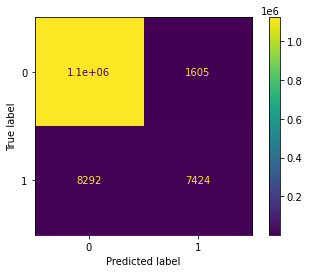

In [ ]:
cm_display.plot()
plt.show()

In [ ]:
Accuracy = metrics.accuracy_score(y_test_numpy, y_pred.round())
Precision = metrics.precision_score(y_test_numpy, y_pred.round())
Sensitivity_recall = metrics.recall_score(y_test_numpy, y_pred.round())
Specificity = metrics.recall_score(y_test_numpy, y_pred.round(), pos_label=0)

print('accuracy: ', Accuracy)
print('precision: ', Precision)
print('recall: ', Sensitivity_recall)
print('specificity: ', Specificity)

accuracy:  0.9913198449026344
precision:  0.8222394506589877
recall:  0.47238483074573684
specificity:  0.9985726621673658


# Prediction Tahap-2

In [ ]:
# !unzip "/content/drive/MyDrive/Healthkathon/Tahap2/Healthkathon 2022 - Machine Learning Tahap 2.zip"

Archive:  /content/drive/MyDrive/Healthkathon/Tahap2/Healthkathon 2022 - Machine Learning Tahap 2.zip
  inflating: sampling2_healthkathon2022_diagnosa.csv  
  inflating: sampling2_healthkathon2022_sep.csv  
  inflating: sampling2_healthkathon_2022_procedure.csv  


In [ ]:
bpjs_tahap2_ori = pd.read_csv("/content/sampling2_healthkathon2022_sep.csv", dtype={'dati2':'int16','typefaskes':'category','jenkel':'category',
                                'politujuan':'category','jenispel':'int8',
                               'kelasrawat':'int8', 'label':'int64', 'usia':'int8', 'kelasrawat':'int8',
                                'kdsa':'category', 'kdsp':'category', 'kdsr':'category', 'kdsi':'category', 'kdsd':'category', 'cbg':'category'})
bpjs_tahap2 = bpjs_tahap2_ori.copy()

In [ ]:
bpjs_tahap2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998941 entries, 0 to 998940
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype   
---  ------       --------------   -----   
 0   id           998941 non-null  int64   
 1   id_peserta   998941 non-null  int64   
 2   dati2        998941 non-null  int16   
 3   typefaskes   998941 non-null  category
 4   usia         998941 non-null  int8    
 5   jenkel       998935 non-null  category
 6   pisat        998935 non-null  float64 
 7   tgldatang    998941 non-null  object  
 8   tglpulang    998941 non-null  object  
 9   jenispel     998941 non-null  int8    
 10  politujuan   890793 non-null  category
 11  diagfktp     998877 non-null  object  
 12  biaya        993892 non-null  float64 
 13  jenispulang  998938 non-null  float64 
 14  cbg          998941 non-null  category
 15  kelasrawat   998941 non-null  int8    
 16  kdsa         978137 non-null  category
 17  kdsp         978209 non-null  category
 18  kdsr

In [ ]:
bpjs_tahap2.isna().sum()

id                  0
id_peserta          0
dati2               0
typefaskes          0
usia                0
jenkel              6
pisat               6
tgldatang           0
tglpulang           0
jenispel            0
politujuan     108148
diagfktp           64
biaya            5049
jenispulang         3
cbg                 0
kelasrawat          0
kdsa            20804
kdsp            20732
kdsr            20803
kdsi            20785
kdsd            20789
dtype: int64

In [ ]:
bpjs_tahap2 = bpjs_tahap2.replace(['NONE','None', 'NaN', 'nan'], np.nan)

In [ ]:
bpjs_tahap2.isna().sum()

id                  0
id_peserta          0
dati2               0
typefaskes          0
usia                0
jenkel              6
pisat               6
tgldatang           0
tglpulang           0
jenispel            0
politujuan     108148
diagfktp           76
biaya            5049
jenispulang         3
cbg                 0
kelasrawat          0
kdsa           998920
kdsp           995476
kdsr           998832
kdsi           998289
kdsd           998270
dtype: int64

In [ ]:
bpjs_tahap2['jenkel'] = bpjs_tahap2['jenkel'].fillna('P')
bpjs_tahap2['pisat'] = bpjs_tahap2['pisat'].fillna(bpjs['pisat'].mode()[0])
bpjs_tahap2['jenispulang'] = bpjs_tahap2['jenispulang'].fillna(bpjs['jenispulang'].mode()[0])
bpjs_tahap2['diagfktp'] = bpjs_tahap2['diagfktp'].fillna(bpjs['diagfktp'].mode()[0])
bpjs_tahap2['biaya'] = bpjs_tahap2['biaya'].fillna(0)
bpjs_tahap2['politujuan'] = bpjs_tahap2['politujuan'].fillna(bpjs['politujuan'].mode()[0])

In [ ]:
bpjs_tahap2['tgldatang'] = bpjs_tahap2['tgldatang'].astype('datetime64[ns]')
bpjs_tahap2['tglpulang'] = bpjs_tahap2['tglpulang'].astype('datetime64[ns]')
bpjs_tahap2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998941 entries, 0 to 998940
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   id           998941 non-null  int64         
 1   id_peserta   998941 non-null  int64         
 2   dati2        998941 non-null  int16         
 3   typefaskes   998941 non-null  category      
 4   usia         998941 non-null  int8          
 5   jenkel       998941 non-null  category      
 6   pisat        998941 non-null  float64       
 7   tgldatang    998941 non-null  datetime64[ns]
 8   tglpulang    998941 non-null  datetime64[ns]
 9   jenispel     998941 non-null  int8          
 10  politujuan   998941 non-null  category      
 11  diagfktp     998941 non-null  object        
 12  biaya        998941 non-null  float64       
 13  jenispulang  998941 non-null  float64       
 14  cbg          998941 non-null  category      
 15  kelasrawat   998941 non-null  int8

In [ ]:
bpjs_tahap2['lama_waktu_hari'] = (bpjs_tahap2['tglpulang'] - bpjs_tahap2['tgldatang']).dt.days
bpjs_tahap2

,id,id_peserta,dati2,typefaskes,usia,jenkel,pisat,tgldatang,tglpulang,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,kdsa,kdsp,kdsr,kdsi,kdsd,lama_waktu_hari
0,847218,323572,216,C,66,P,3.0,2020-03-05 17:00:00,2020-03-05 17:00:00,2,JAN,I11,181400.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0
1,140281,766436,117,SC,64,P,1.0,2019-04-03 17:00:00,2019-04-03 17:00:00,2,JAN,I11.0,190400.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0
2,756543,87287,150,SB,70,L,1.0,2020-03-17 17:00:00,2020-03-17 17:00:00,2,JAN,Z09.9,192400.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0
3,608391,56260,135,SC,50,L,1.0,2019-09-30 17:00:00,2019-09-30 17:00:00,2,HDL,N18.0,825500.0,1.0,N-3-15-0,3,NaN,NaN,NaN,NaN,NaN,0
4,144907,491605,117,SC,31,P,1.0,2018-11-12 17:00:00,2018-11-12 17:00:00,2,OBG,N89,311300.0,1.0,Z-3-25-0,3,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998936,639319,810956,221,SB,24,L,4.0,2019-09-23 17:00:00,2019-09-27 17:00:00,1,IGD,Z09.8,8672000.0,1.0,M-1-80-I,3,NaN,NaN,NaN,NaN,NaN,4
998937,319289,459906,194,KM,28,P,3.0,2019-12-05 17:00:00,2019-12-05 17:00:00,2,MAT,H54.2,210600.0,1.0,H-3-12-0,3,NaN,NaN,NaN,NaN,NaN,0
998938,98088,807487,3,B,37,L,1.0,2018-10-02 17:00:00,2018-10-02 17:00:00,2,SAR,N32.8,185500.0,1.0,Q-5-44-0,3,NaN,NaN,NaN,NaN,NaN,0
998939,223530,708706,138,SC,66,P,1.0,2019-03-12 17:00:00,2019-03-15 17:00:00,1,IGD,Z04.9,2652900.0,1.0,I-4-12-I,3,NaN,NaN,NaN,NaN,NaN,3


In [ ]:
bpjs_tahap2['diagfktp'] = bpjs_tahap2['diagfktp'].str.upper()
bpjs_tahap2['cbg'] = bpjs_tahap2['cbg'].str.upper()
bpjs_tahap2['typefaskes'] = bpjs_tahap2['typefaskes'].str.upper()
bpjs_tahap2['politujuan'] = bpjs_tahap2['politujuan'].str.upper()

In [ ]:
bpjs_tahap2['diagfktp'] = bpjs_tahap2['diagfktp'].str.replace(".0$", '', regex=True)

In [ ]:
bpjs_tahap2 = bpjs_tahap2.drop(['id_peserta', 'kdsa' , 'kdsp', 'kdsr', 'kdsi', 'kdsd','tgldatang', 'tglpulang'], axis=1)
bpjs_tahap2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998941 entries, 0 to 998940
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype   
---  ------           --------------   -----   
 0   id               998941 non-null  int64   
 1   dati2            998941 non-null  int16   
 2   typefaskes       998941 non-null  object  
 3   usia             998941 non-null  int8    
 4   jenkel           998941 non-null  category
 5   pisat            998941 non-null  float64 
 6   jenispel         998941 non-null  int8    
 7   politujuan       998941 non-null  object  
 8   diagfktp         998941 non-null  object  
 9   biaya            998941 non-null  float64 
 10  jenispulang      998941 non-null  float64 
 11  cbg              998941 non-null  object  
 12  kelasrawat       998941 non-null  int8    
 13  lama_waktu_hari  998941 non-null  int64   
dtypes: category(1), float64(3), int16(1), int64(2), int8(3), object(4)
memory usage: 74.3+ MB


In [ ]:
cols_list = bpjs_tahap2.columns

for i in cols_list:
  print(i, ' memiliki jumlah nilai uniq sebanyak ', len(bpjs_tahap2[i].unique()))

id  memiliki jumlah nilai uniq sebanyak  998941
dati2  memiliki jumlah nilai uniq sebanyak  487
typefaskes  memiliki jumlah nilai uniq sebanyak  26
usia  memiliki jumlah nilai uniq sebanyak  108
jenkel  memiliki jumlah nilai uniq sebanyak  2
pisat  memiliki jumlah nilai uniq sebanyak  5
jenispel  memiliki jumlah nilai uniq sebanyak  2
politujuan  memiliki jumlah nilai uniq sebanyak  207
diagfktp  memiliki jumlah nilai uniq sebanyak  8902
biaya  memiliki jumlah nilai uniq sebanyak  17793
jenispulang  memiliki jumlah nilai uniq sebanyak  5
cbg  memiliki jumlah nilai uniq sebanyak  875
kelasrawat  memiliki jumlah nilai uniq sebanyak  3
lama_waktu_hari  memiliki jumlah nilai uniq sebanyak  76


In [ ]:
bpjs_copy_tahap2 = bpjs_tahap2.copy()

In [ ]:
bpjs_tahap2 = pd.get_dummies(data=bpjs_tahap2, columns=['jenkel'])
bpjs_tahap2.head()

,id,dati2,typefaskes,usia,pisat,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P
0,847218,216,C,66,3.0,2,JAN,I11,181400.0,1.0,Q-5-44-0,3,0,0,1
1,140281,117,SC,64,1.0,2,JAN,I11,190400.0,1.0,Q-5-44-0,3,0,0,1
2,756543,150,SB,70,1.0,2,JAN,Z09.9,192400.0,1.0,Q-5-44-0,3,0,1,0
3,608391,135,SC,50,1.0,2,HDL,N18,825500.0,1.0,N-3-15-0,3,0,1,0
4,144907,117,SC,31,1.0,2,OBG,N89,311300.0,1.0,Z-3-25-0,3,0,0,1


In [ ]:
# # bpjs_copy_tahap2 = bpjs_copy_tahap2.drop(['dati2'], axis=1)
# # bpjs_copy_tahap2 = bpjs_copy_tahap2.drop(['diagfktp'], axis=1)
# bpjs_copy_tahap2

In [ ]:
data_id_tahap2 = bpjs_tahap2.pop('id')
# Y_tahap2 = bpjs_copy_tahap2.pop('label')
X_tahap2 = bpjs_tahap2

In [ ]:
X_tahap2

,dati2,typefaskes,usia,pisat,jenispel,politujuan,diagfktp,biaya,jenispulang,cbg,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P
0,216,C,66,3.0,2,JAN,I11,181400.0,1.0,Q-5-44-0,3,0,0,1
1,117,SC,64,1.0,2,JAN,I11,190400.0,1.0,Q-5-44-0,3,0,0,1
2,150,SB,70,1.0,2,JAN,Z09.9,192400.0,1.0,Q-5-44-0,3,0,1,0
3,135,SC,50,1.0,2,HDL,N18,825500.0,1.0,N-3-15-0,3,0,1,0
4,117,SC,31,1.0,2,OBG,N89,311300.0,1.0,Z-3-25-0,3,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998936,221,SB,24,4.0,1,IGD,Z09.8,8672000.0,1.0,M-1-80-I,3,4,1,0
998937,194,KM,28,3.0,2,MAT,H54.2,210600.0,1.0,H-3-12-0,3,0,0,1
998938,3,B,37,1.0,2,SAR,N32.8,185500.0,1.0,Q-5-44-0,3,0,1,0
998939,138,SC,66,1.0,1,IGD,Z04.9,2652900.0,1.0,I-4-12-I,3,3,0,1


In [ ]:
X_tahap2[['typefaskes Encoded', 'politujuan Encoded', 'diagfktp Encoded','cbg Encoded']] = encoder.transform(X_tahap2[['typefaskes', 'politujuan', 'diagfktp','cbg']])

In [ ]:
# X_tahap2.

In [ ]:
X_tahap2 = X_tahap2.drop(['typefaskes', 'politujuan', 'diagfktp', 'cbg'], axis=1)
X_tahap2

,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P,typefaskes Encoded,politujuan Encoded,diagfktp Encoded,cbg Encoded
0,216,66,3.0,2,181400.0,1.0,3,0,0,1,0.013759,0.017801,0.013719,0.009577
1,117,64,1.0,2,190400.0,1.0,3,0,0,1,0.011293,0.017801,0.013719,0.009577
2,150,70,1.0,2,192400.0,1.0,3,0,1,0,0.010086,0.017801,0.017269,0.009577
3,135,50,1.0,2,825500.0,1.0,3,0,1,0,0.011293,0.001684,0.008702,0.002102
4,117,31,1.0,2,311300.0,1.0,3,0,0,1,0.011293,0.016109,0.003268,0.017087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998936,221,24,4.0,1,8672000.0,1.0,3,4,1,0,0.010086,0.013253,0.016479,0.012973
998937,194,28,3.0,2,210600.0,1.0,3,0,0,1,0.037590,0.022565,0.031937,0.049140
998938,3,37,1.0,2,185500.0,1.0,3,0,1,0,0.013759,0.010822,0.032680,0.009577
998939,138,66,1.0,1,2652900.0,1.0,3,3,0,1,0.011293,0.013253,0.006083,0.006950


In [ ]:
X_tahap2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998941 entries, 0 to 998940
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   dati2               998941 non-null  int16  
 1   usia                998941 non-null  int8   
 2   pisat               998941 non-null  float64
 3   jenispel            998941 non-null  int8   
 4   biaya               998941 non-null  float64
 5   jenispulang         998941 non-null  float64
 6   kelasrawat          998941 non-null  int8   
 7   lama_waktu_hari     998941 non-null  int64  
 8   jenkel_L            998941 non-null  uint8  
 9   jenkel_P            998941 non-null  uint8  
 10  typefaskes Encoded  998941 non-null  float64
 11  politujuan Encoded  998941 non-null  float64
 12  diagfktp Encoded    998941 non-null  float64
 13  cbg Encoded         998941 non-null  float64
dtypes: float64(7), int16(1), int64(1), int8(3), uint8(2)
memory usage: 67.6 MB


In [ ]:
X_tahap2[['dati2', 'biaya', 'lama_waktu_hari', 'usia']] = scalerr.transform(X_tahap2[['dati2', 'biaya', 'lama_waktu_hari', 'usia']])
X_tahap2

,dati2,usia,pisat,jenispel,biaya,jenispulang,kelasrawat,lama_waktu_hari,jenkel_L,jenkel_P,typefaskes Encoded,politujuan Encoded,diagfktp Encoded,cbg Encoded
0,0.315285,1.262806,3.0,2,-0.375611,1.0,3,-0.288033,0,1,0.013759,0.017801,0.013719,0.009577
1,-0.617444,1.175548,1.0,2,-0.373881,1.0,3,-0.288033,0,1,0.011293,0.017801,0.013719,0.009577
2,-0.306534,1.437322,1.0,2,-0.373497,1.0,3,-0.288033,1,0,0.010086,0.017801,0.017269,0.009577
3,-0.447857,0.564741,1.0,2,-0.251828,1.0,3,-0.288033,1,0,0.011293,0.001684,0.008702,0.002102
4,-0.617444,-0.264210,1.0,2,-0.350647,1.0,3,-0.288033,0,1,0.011293,0.016109,0.003268,0.017087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998936,0.362393,-0.569613,4.0,1,1.256110,1.0,3,0.467641,1,0,0.010086,0.013253,0.016479,0.012973
998937,0.108012,-0.395097,3.0,2,-0.369999,1.0,3,-0.288033,0,1,0.037590,0.022565,0.031937,0.049140
998938,-1.691496,-0.002436,1.0,2,-0.374823,1.0,3,-0.288033,1,0,0.013759,0.010822,0.032680,0.009577
998939,-0.419592,1.262806,1.0,1,0.099361,1.0,3,0.278722,0,1,0.011293,0.013253,0.006083,0.006950


In [ ]:
X_tahap2_numpy = X_tahap2.to_numpy()
# y_tahap2_numpy = y_tahap2.to_numpy()
print(X_tahap2_numpy.shape)

(998941, 14)


In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn import metrics

y_pred_tahap2 = clf.predict(X_tahap2_numpy)

In [ ]:
import pandas as pd
series_1 = pd.Series(data_id_tahap2)
series_2 = pd.Series(y_pred_tahap2)

In [ ]:
data_csv = pd.DataFrame(columns = ['id', 'label'])

In [ ]:
data_csv['id'] = series_1
data_csv['label'] = series_2

In [ ]:
data_csv['label'].value_counts()

0    992475
1      6466
Name: label, dtype: int64

In [ ]:
data_csv.to_csv(index=False)

'id,label\n847218,0\n140281,0\n756543,0\n608391,0\n144907,0\n897664,0\n817662,0\n376819,0\n130856,0\n351257,0\n338822,0\n783601,0\n668468,0\n588592,0\n607667,0\n431367,0\n810136,0\n632736,0\n558572,0\n556697,1\n160146,0\n616930,0\n268136,0\n228611,0\n749134,0\n886510,0\n693983,0\n759783,0\n795935,0\n922064,0\n188672,0\n342488,0\n555104,0\n990292,0\n743371,0\n691312,0\n561182,0\n591127,0\n208975,0\n508235,0\n932811,0\n80086,0\n621891,0\n960484,0\n301151,0\n499938,0\n539778,0\n319440,0\n319286,0\n910579,0\n608318,0\n633230,0\n765730,0\n871384,0\n985776,0\n312062,0\n704493,0\n105020,0\n884117,0\n487667,0\n284365,0\n666762,0\n117208,0\n900094,0\n287728,0\n567886,0\n626922,0\n823354,0\n416285,0\n254006,0\n13888,0\n873372,0\n186419,0\n199061,0\n250174,0\n245734,0\n612499,0\n974813,0\n455092,0\n428632,0\n463220,0\n118196,0\n683205,0\n788959,0\n291148,0\n732203,0\n687101,0\n560024,0\n762023,0\n126029,0\n714486,0\n274590,0\n227010,0\n399606,0\n622562,0\n144659,0\n420259,0\n663306,0\n655184,0\n6

In [ ]:
pip freeze > requirements.txt